<a href="https://colab.research.google.com/github/liviaceciliags/GoldFever/blob/main/train_yolo11n.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Train YOLO11 Object Detection on a Custom Dataset

---

[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/ultralytics/ultralytics)

YOLO11 builds on the advancements introduced in YOLOv9 and YOLOv10 earlier this year, incorporating improved architectural designs, enhanced feature extraction techniques, and optimized training methods.

YOLO11m achieves a higher mean mAP score on the COCO dataset while using 22% fewer parameters than YOLOv8m, making it computationally lighter without sacrificing performance.

YOLOv11 is available in 5 different sizes, ranging from `2.6M` to `56.9M` parameters, and capable of achieving from `39.5` to `54.7` mAP on the COCO dataset.

## Setup

### Configure API keys

To fine-tune YOLO11, you need to provide your Roboflow API key. Follow these steps:

- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑). Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

### Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Sun Jun 29 23:52:27 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   53C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
%cd /content/drive/MyDrive/LiviaCecilia/yolov11
HOME = os.getcwd()
print(HOME)

/content/drive/MyDrive/LiviaCecilia/yolov11
/content/drive/MyDrive/LiviaCecilia/yolov11


## Install YOLO11 via Ultralytics

In [ ]:
%pip install "ultralytics<=8.3.40" supervision roboflow
import ultralytics
ultralytics.checks()

Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.0/235.7 GB disk)


## Inference with model pre-trained on COCO dataset

### CLI

**NOTE:** CLI requires no customization or Python code. You can simply run all tasks from the terminal with the yolo command.

In [ ]:
!yolo task=detect mode=predict model=yolo11n.pt conf=0.25 source='https://media.roboflow.com/notebooks/examples/dog.jpeg' save=True

Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs

Found https://media.roboflow.com/notebooks/examples/dog.jpeg locally at dog.jpeg
image 1/1 /content/drive/MyDrive/LiviaCecilia/yolov11/dog.jpeg: 640x384 2 persons, 1 car, 1 dog, 1 handbag, 169.4ms
Speed: 14.8ms preprocess, 169.4ms inference, 538.7ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/detect/predict3
💡 Learn more at https://docs.ultralytics.com/modes/predict


**NOTE:** Result annotated image got saved in `{HOME}/runs/detect/predict/`. Let's display it.

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/predict/dog.jpeg', width=600)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/LiviaCecilia/yolov11/runs/detect/predict/dog.jpeg'

### SDK

**NOTE:** YOLO's Python interface allows for seamless integration into your Python projects, making it easy to load, run, and process the model's output.

In [ ]:
from ultralytics import YOLO
from PIL import Image
import requests

model = YOLO('yolo11n.pt')
image = Image.open(requests.get('https://media.roboflow.com/notebooks/examples/dog.jpeg', stream=True).raw)
result = model.predict(image, conf=0.25)[0]

**NOTE:** The obtained `result` object stores information about the location, classes, and confidence levels of the detected objects.

In [ ]:
result.boxes.xyxy

In [ ]:
result.boxes.conf

In [ ]:
result.boxes.cls

**NOTE:** YOLO11 can be easily integrated with `supervision` using the familiar `from_ultralytics` connector.

In [ ]:
import supervision as sv

detections = sv.Detections.from_ultralytics(result)

In [ ]:
box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator(text_color=sv.Color.BLACK)

annotated_image = image.copy()
annotated_image = box_annotator.annotate(annotated_image, detections=detections)
annotated_image = label_annotator.annotate(annotated_image, detections=detections)

sv.plot_image(annotated_image, size=(10, 10))

## Fine-tune YOLO11 on custom dataset

**NOTE:** When training YOLOv11, make sure your data is located in `datasets`. If you'd like to change the default location of the data you want to use for fine-tuning, you can do so through Ultralytics' `settings.json`. In this tutorial, we will use one of the [datasets](https://universe.roboflow.com/liangdianzhong/-qvdww) available on [Roboflow Universe](https://universe.roboflow.com/). When downloading, make sure to select the `yolov11` export format.

## Custom Training

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

from google.colab import userdata
from roboflow import Roboflow

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

workspace = rf.workspace("ic-fgbe1").project("ic-xgmobile")
version = workspace.version(11)
dataset = version.download("yolov11")

mkdir: cannot create directory ‘/content/drive/MyDrive/LiviaCecilia/yolov11/datasets’: File exists
/content/drive/MyDrive/LiviaCecilia/yolov11/datasets
loading Roboflow workspace...
loading Roboflow project...


In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolo11n.pt data=/content/drive/MyDrive/LiviaCecilia/yolov11/datasets/IC---xGMobile-11/data.yaml epochs=300 imgsz=640 plots=True patience=20

/content/drive/MyDrive/LiviaCecilia/yolov11
New https://pypi.org/project/ultralytics/8.3.160 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/drive/MyDrive/LiviaCecilia/yolov11/datasets/IC---xGMobile-11/data.yaml, epochs=300, time=None, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train12, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augme

**NOTE:** The results of the completed training are saved in `{HOME}/runs/detect/train/`. Let's examine them.

In [ ]:
!ls {HOME}/runs/detect/train3/

args.yaml					    R_curve.png		  train_batch76272.jpg
confusion_matrix_normalized.png			    results.csv		  val_batch0_labels.jpg
confusion_matrix.png				    results.png		  val_batch0_pred.jpg
events.out.tfevents.1742352156.35c523a0b29d.4117.0  roboflow_deploy.zip   val_batch1_labels.jpg
F1_curve.png					    state_dict.pt	  val_batch1_pred.jpg
labels_correlogram.jpg				    train_batch0.jpg	  val_batch2_labels.jpg
labels.jpg					    train_batch1.jpg	  val_batch2_pred.jpg
model_artifacts.json				    train_batch2.jpg	  weights
P_curve.png					    train_batch76270.jpg
PR_curve.png					    train_batch76271.jpg


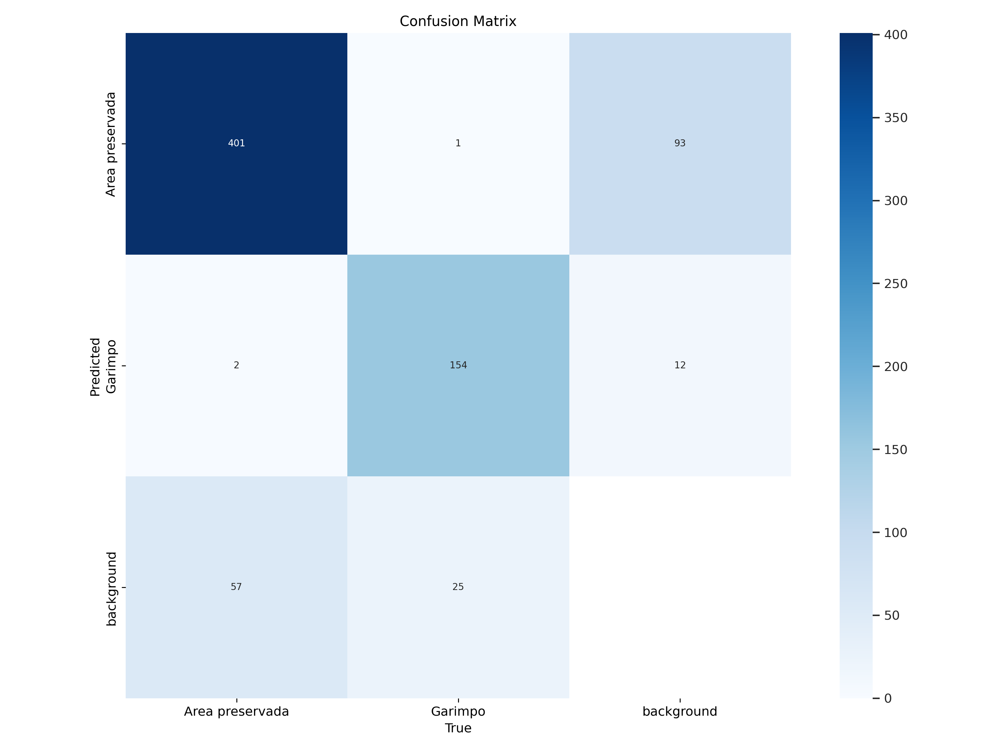

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/train3/confusion_matrix.png', width=600)

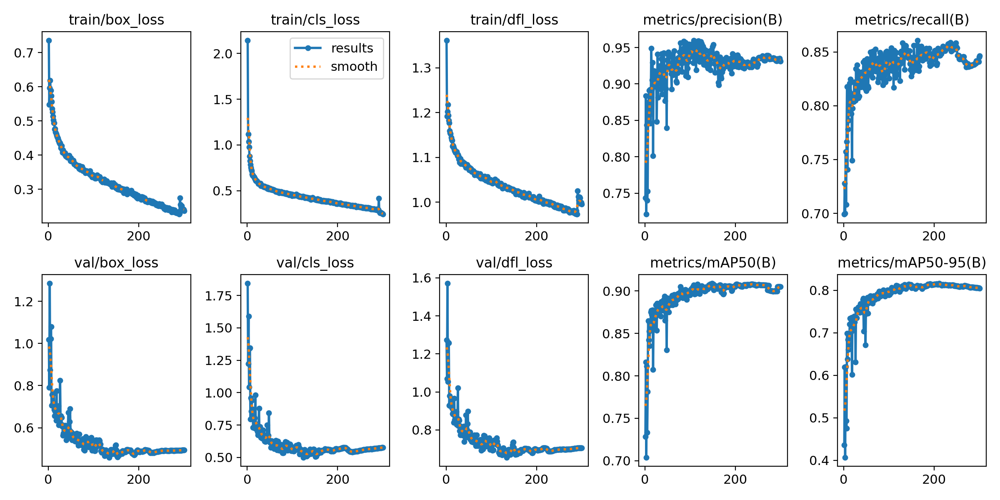

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/train3/results.png', width=600)

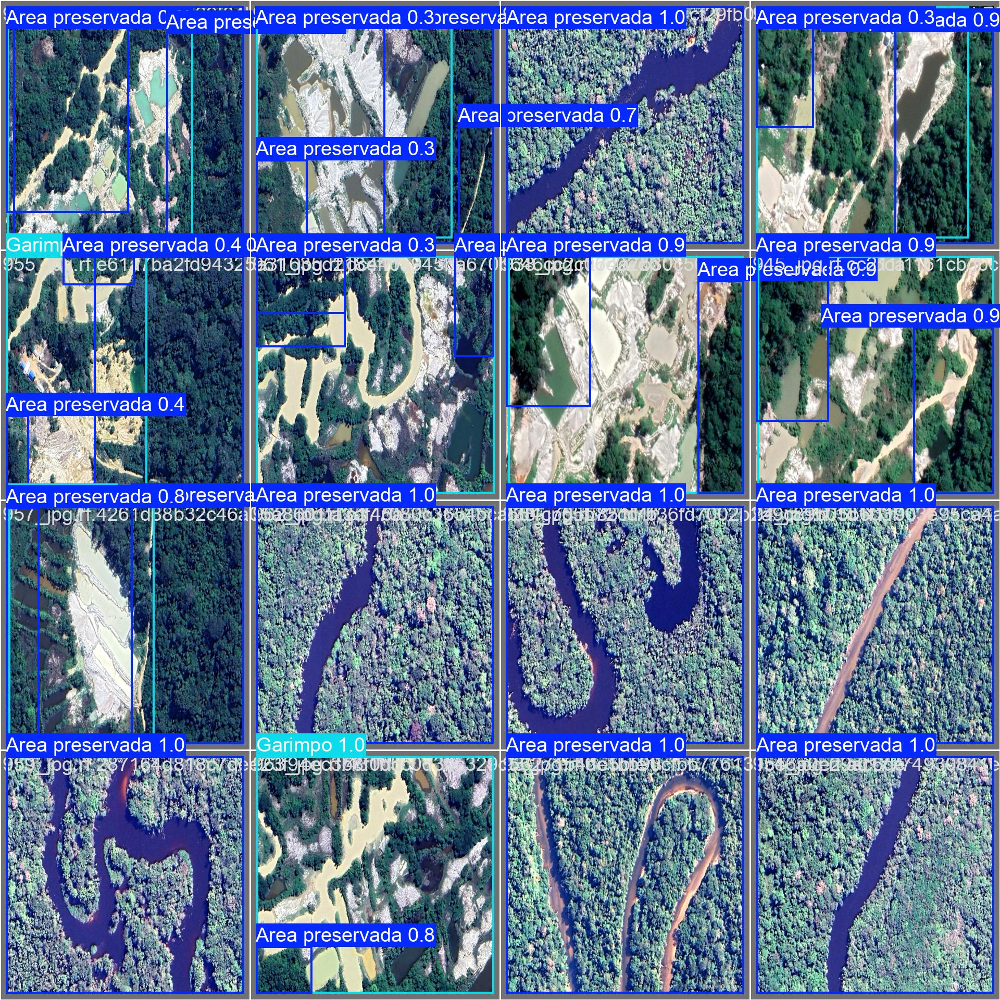

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/train3/val_batch0_pred.jpg', width=600)

## Validate fine-tuned model

In [ ]:
!yolo task=detect mode=val model={HOME}/runs/detect/train3/weights/best.pt data={dataset.location}/data.yaml

Ultralytics 8.3.40 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/drive/MyDrive/LiviaCecilia/yolov11/datasets/IC---xGMobile-11/valid/labels.cache... 300 images, 0 backgrounds, 0 corrupt: 100% 300/300 [00:00<?, ?it/s]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 489, len(boxes) = 640. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 19/19 [00:06<00:00,  2.79it/s]
                   all        300        640      0.934      0.847      0.906      0.816
       Area preservada        297        460      0.898      0.844      0.897      0.811
               Garimpo        151        180       0.97       0.85      0.914      0.

## Inference with custom model

In [ ]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/LiviaCecilia/yolov11/runs/detect/train7/weights/best.pt conf=0.25 source=/content/drive/MyDrive/LiviaCecilia/duasimagens save=True

Ultralytics 8.3.40 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

image 1/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/1.jpg: 384x640 4 Area preservadas, 1 Garimpo, 69.0ms
image 2/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/2.jpg: 384x640 2 Area preservadas, 1 Garimpo, 9.5ms
image 3/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/3.jpg: 384x640 2 Area preservadas, 1 Garimpo, 9.0ms
image 4/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/4.jpg: 448x640 3 Area preservadas, 1 Garimpo, 43.0ms
image 5/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/5.jpg: 448x640 2 Area preservadas, 1 Garimpo, 9.4ms
Speed: 5.3ms preprocess, 28.0ms inference, 111.2ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict12
💡 Learn more at https://docs.ultralytics.com/modes/predict


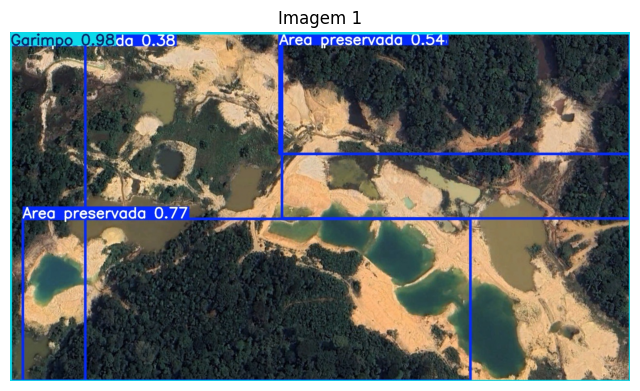

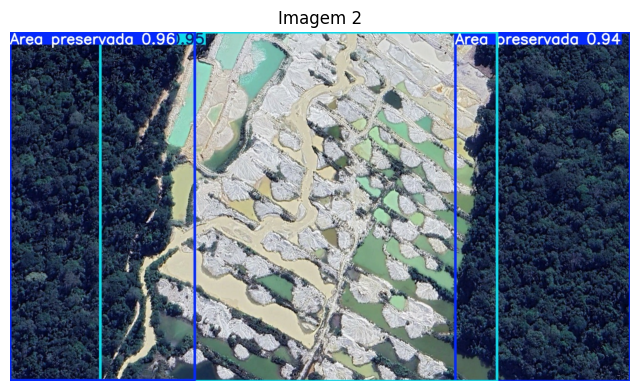

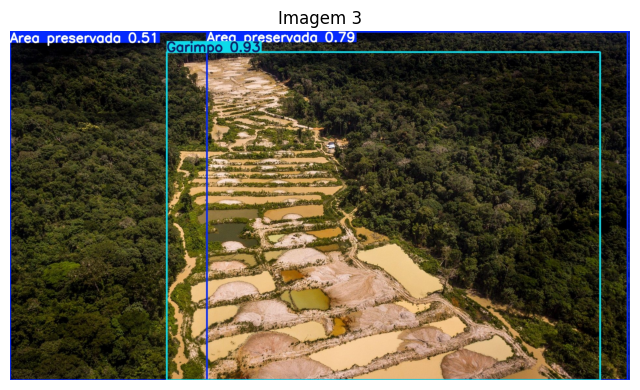

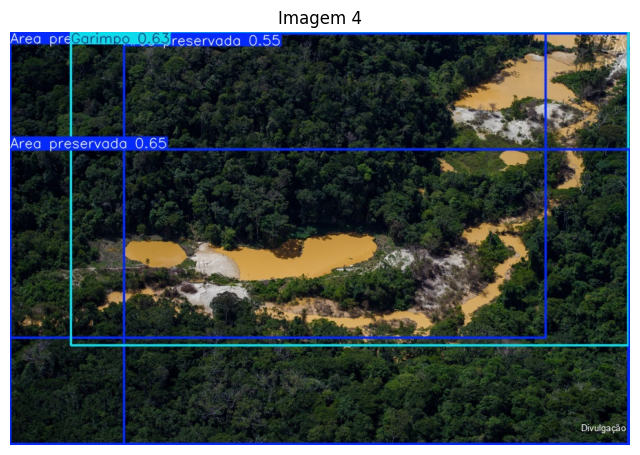

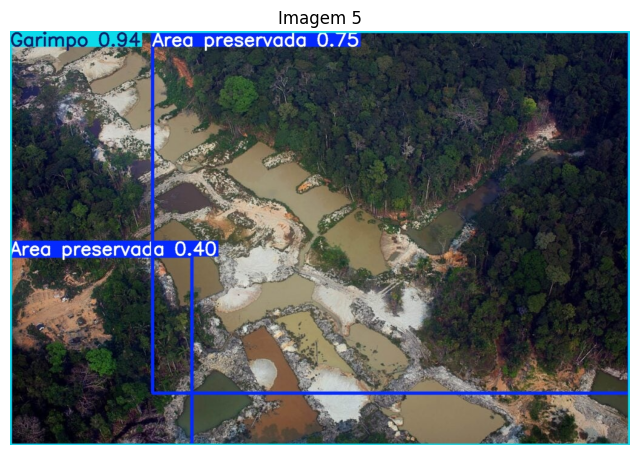

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# Caminho para os resultados do YOLO
result_dir = 'runs/detect/predict12'

# Lista dos arquivos das imagens processadas
image_files = ['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg']

# Exibir cada imagem individualmente
for i, file_name in enumerate(image_files):
    img_path = os.path.join(result_dir, file_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.title(f'Imagem {i + 1}')
    plt.axis('off')
    plt.show()


Tempo médio de inferência

In [ ]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/LiviaCecilia/yolov11/runs/detect/train11/weights/best.pt conf=0.25 source=/content/drive/MyDrive/LiviaCecilia/Imagens_Dateset_Garimpo save=True > logs.txt 2>&1

In [ ]:
import re

# Lê o arquivo de logs
with open("logs.txt", "r") as file:
    logs = file.readlines()

# Extrai os tempos de inferência (último valor antes de 'ms' em cada linha de imagem)
inference_times = []
for line in logs:
    if "image" in line and "ms" in line:
        time_match = re.search(r"(\d+\.\d+)ms", line)
        if time_match:
            inference_times.append(float(time_match.group(1)))

# Calcula a média
if inference_times:
    avg_time = sum(inference_times) / len(inference_times)
    print(f"✅ Tempo médio de inferência: {avg_time:.2f} ms (baseado em {len(inference_times)} imagens)")
else:
    print("❌ Nenhum tempo de inferência encontrado nos logs.")

✅ Tempo médio de inferência: 10.29 ms (baseado em 1292 imagens)


**NOTE:** Let's take a look at few results.

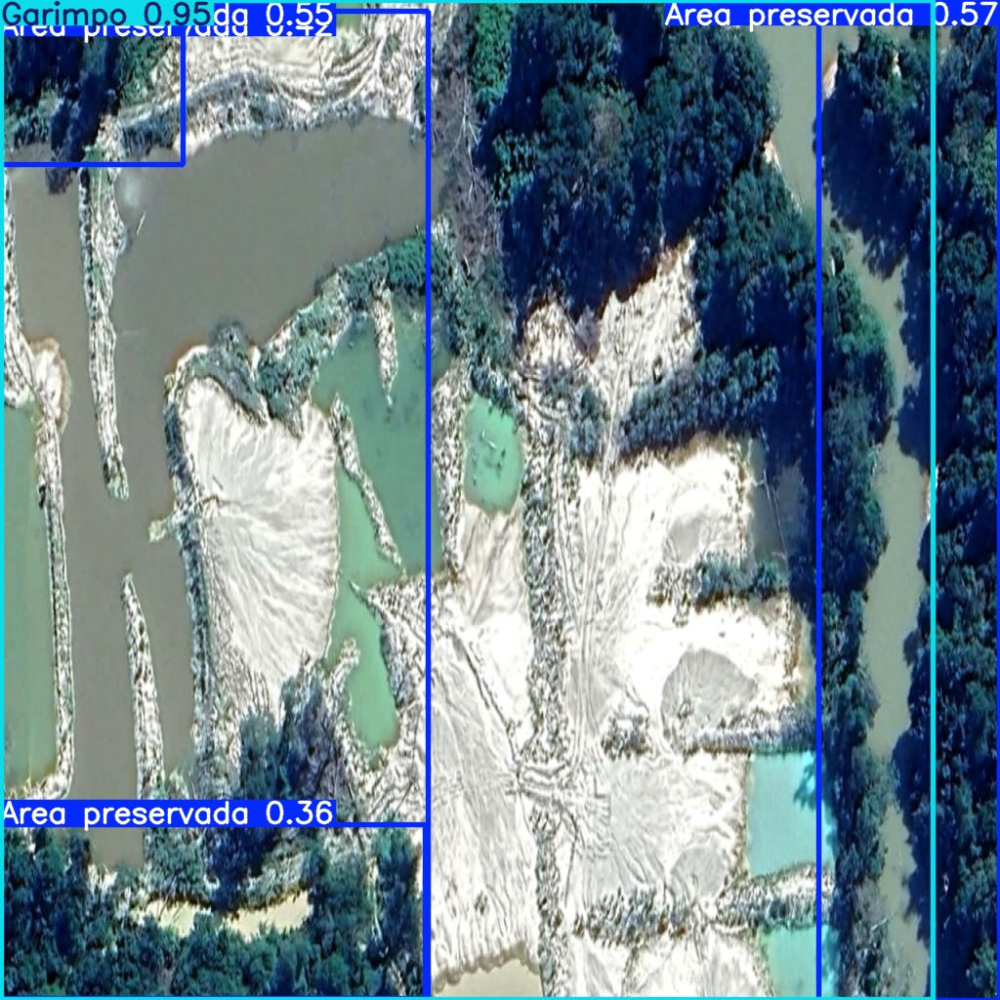

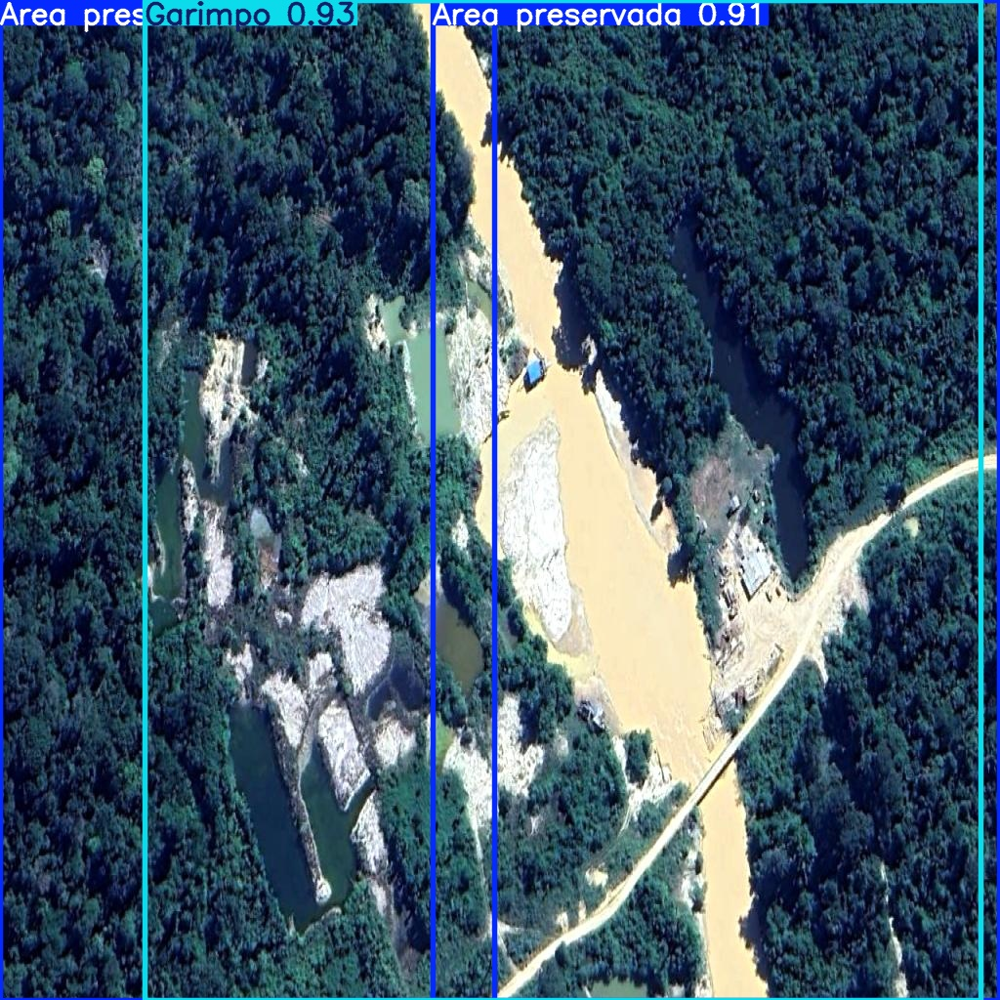

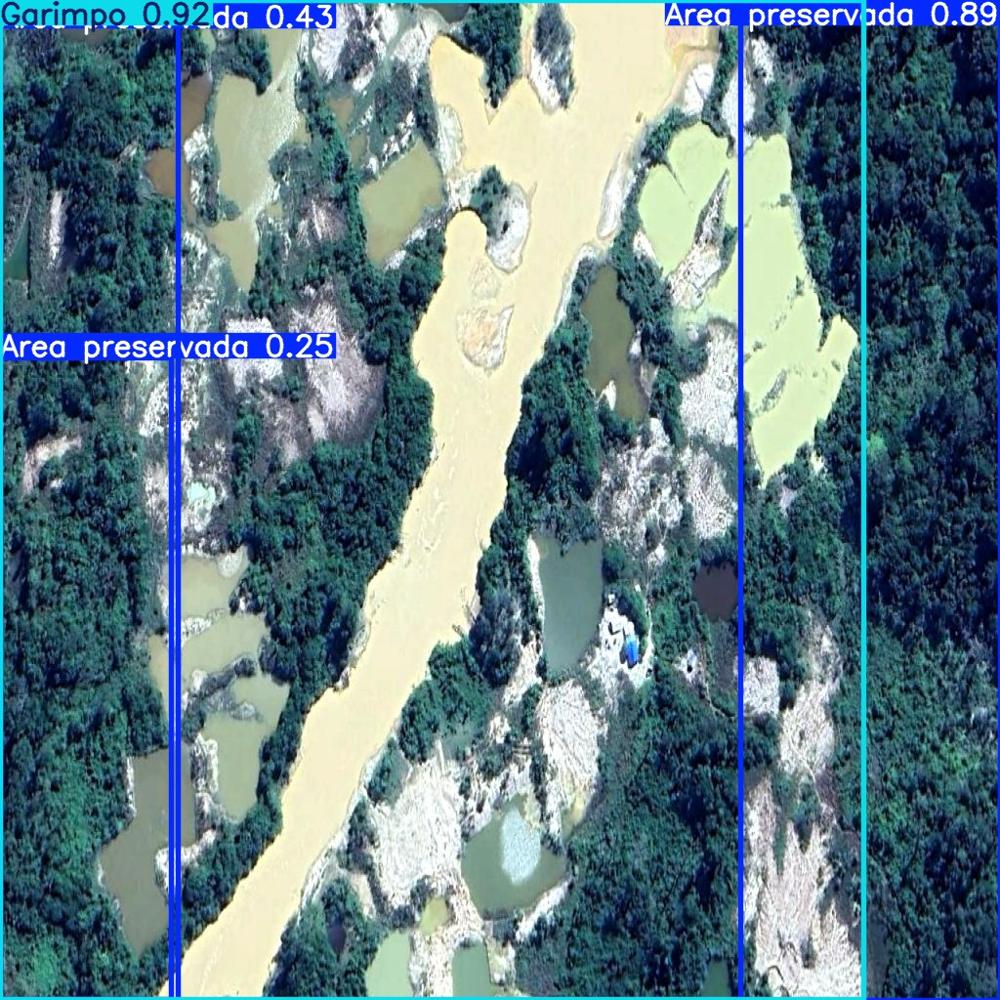

In [ ]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob(f'{HOME}/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[:3]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [ ]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/LiviaCecilia/yolov11/runs/detect/train3/weights/best.pt conf=0.40 source=/content/drive/MyDrive/LiviaCecilia/duasimagens save=True project='/content/drive/MyDrive/LiviaCecilia/yolov11/runs/detect/predict_unique'


Ultralytics 8.3.40 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

image 1/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/1.jpg: 384x640 3 Area preservadas, 1 Garimpo, 65.5ms
image 2/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/2.jpg: 384x640 2 Area preservadas, 1 Garimpo, 9.0ms
image 3/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/3.jpg: 384x640 1 Area preservada, 1 Garimpo, 9.5ms
image 4/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/4.jpg: 448x640 1 Area preservada, 1 Garimpo, 41.9ms
image 5/5 /content/drive/MyDrive/LiviaCecilia/duasimagens/5.jpg: 448x640 1 Area preservada, 1 Garimpo, 8.7ms
Speed: 2.2ms preprocess, 26.9ms inference, 33.4ms postprocess per image at shape (1, 3, 448, 640)
Results saved to /content/drive/MyDrive/LiviaCecilia/yolov11/runs/detect/predict_unique/predict11
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
!ls /content/drive/MyDrive/LiviaCecilia/yolov11/runs/detect/train3

args.yaml					    R_curve.png		  train_batch76272.jpg
confusion_matrix_normalized.png			    results.csv		  val_batch0_labels.jpg
confusion_matrix.png				    results.png		  val_batch0_pred.jpg
events.out.tfevents.1742352156.35c523a0b29d.4117.0  roboflow_deploy.zip   val_batch1_labels.jpg
F1_curve.png					    state_dict.pt	  val_batch1_pred.jpg
labels_correlogram.jpg				    train_batch0.jpg	  val_batch2_labels.jpg
labels.jpg					    train_batch1.jpg	  val_batch2_pred.jpg
model_artifacts.json				    train_batch2.jpg	  weights
P_curve.png					    train_batch76270.jpg
PR_curve.png					    train_batch76271.jpg


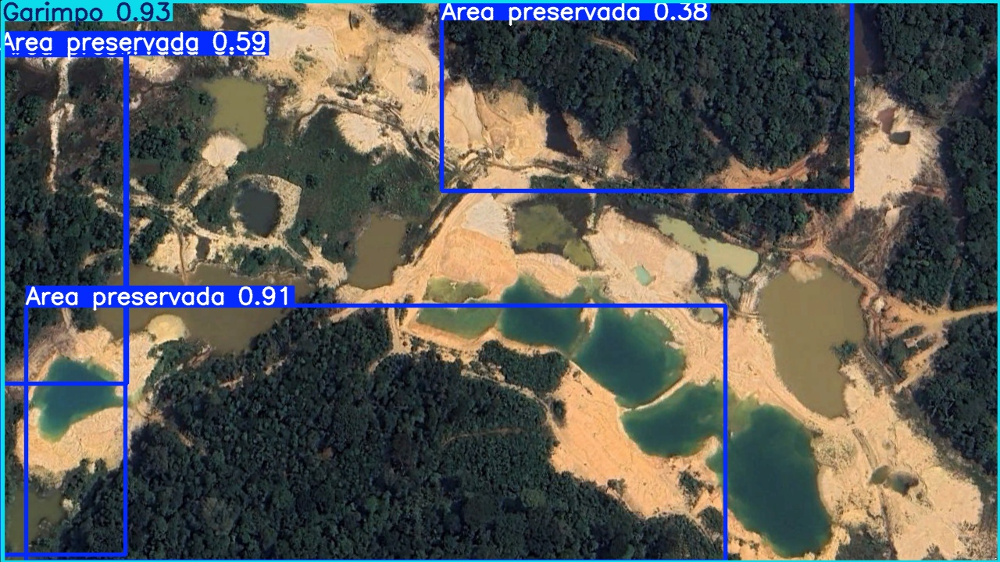

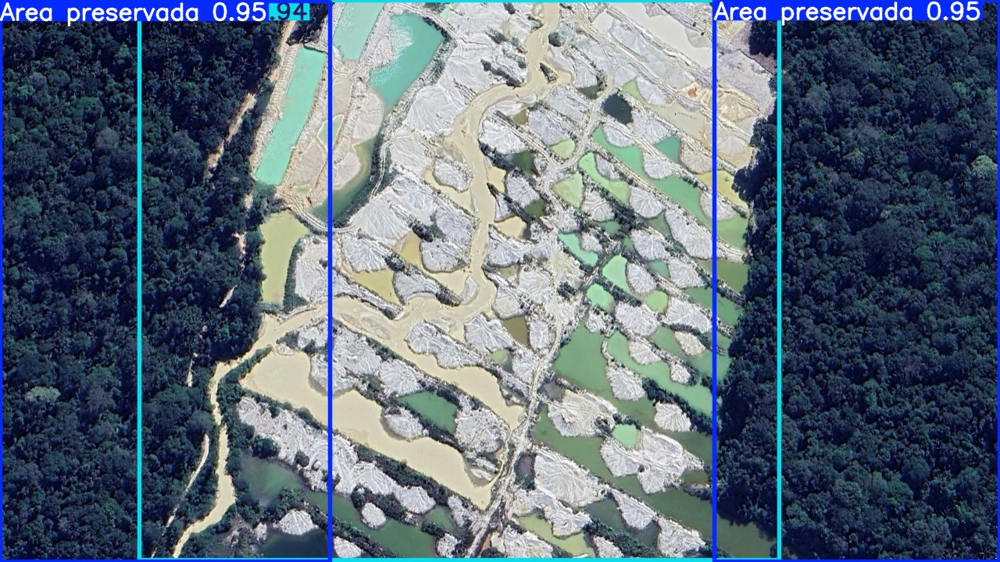

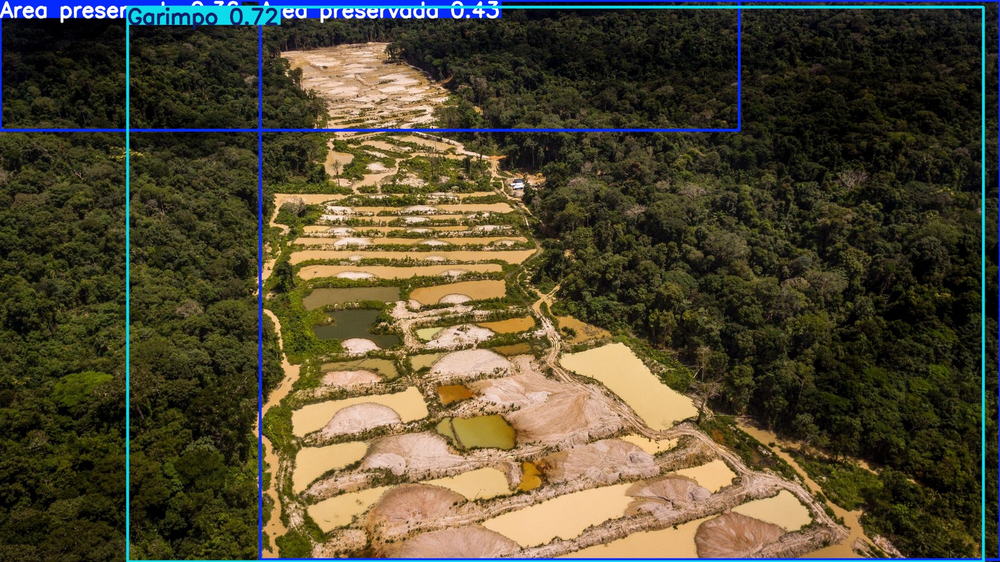

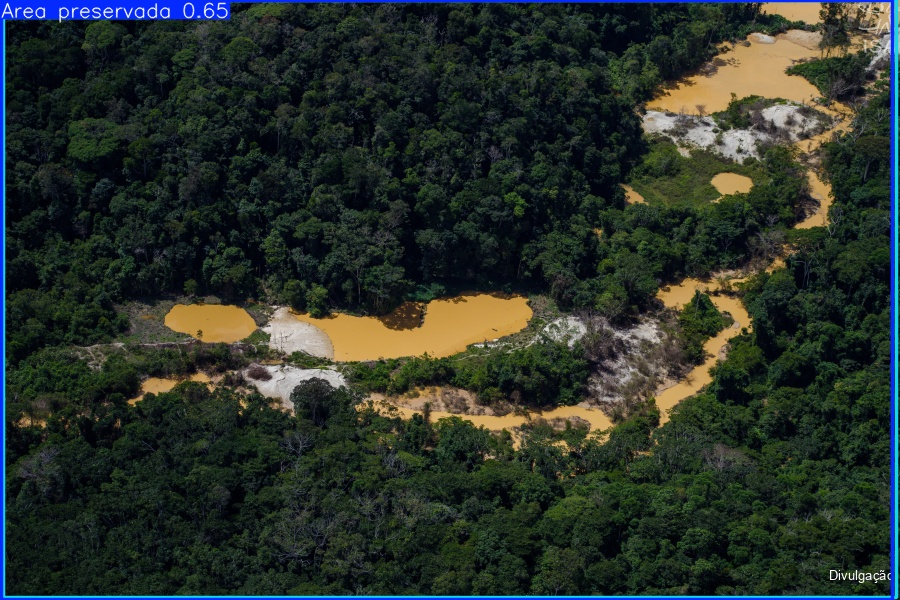

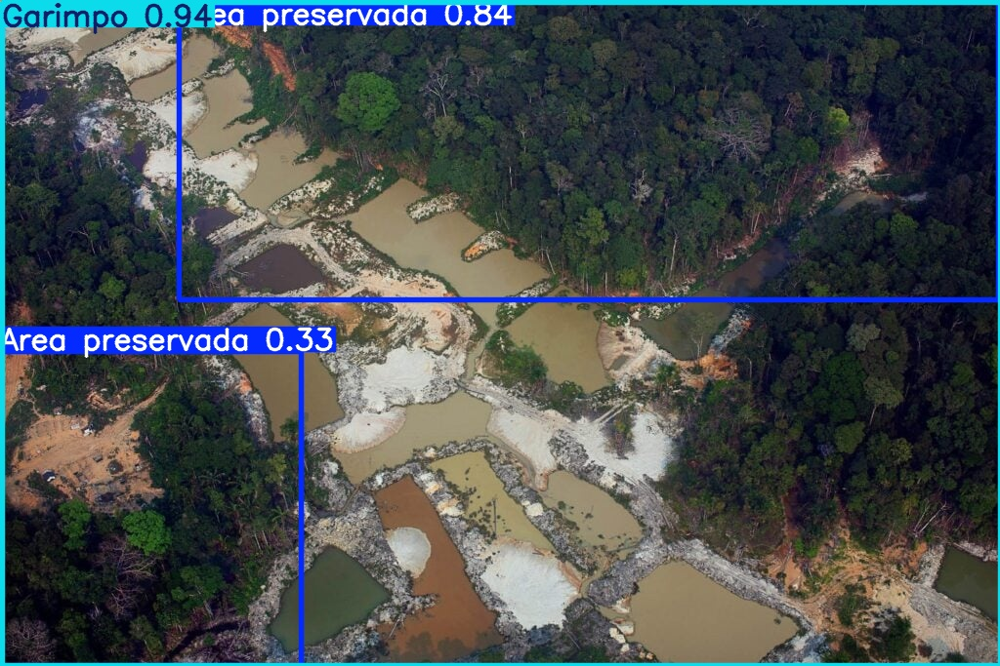

In [ ]:
import glob
import os
from IPython.display import Image as IPyImage, display

# Certifique-se de que o caminho de HOME está correto e busque o diretório mais recente
latest_folder = max(glob.glob(f'/content/drive/MyDrive/LiviaCecilia/yolov11/runs/detect/predict_unique/predict10'), key=os.path.getmtime)

# Exibe as imagens processadas do diretório mais recente
for img in glob.glob(f'{latest_folder}/*.jpg')[:10]:
    display(IPyImage(filename=img, width=600))
    print("\n")


QUANTIZAÇÃO

In [ ]:
!pip install ultralytics --upgrade
!pip install nvidia-tensorrt --extra-index-url https://pypi.ngc.nvidia.com



In [ ]:
import glob
import os
import cv2
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, precision_recall_curve
import seaborn as sns
from ultralytics import YOLO
import torch
import numpy as np

In [ ]:
# Caminho do modelo YOLOv12 treinado
MODEL_PT_PATH = '/content/drive/MyDrive/LiviaCecilia/yolov11/runs/detect/train3/weights/best.pt'

# Carregue o modelo
model = YOLO(MODEL_PT_PATH)

In [ ]:
TRT_EXPORT_PATH = '/content/drive/MyDrive/LiviaCecilia/yolov11/tensorrt/'
os.makedirs(TRT_EXPORT_PATH, exist_ok=True)

In [ ]:
model.export(
    format='engine',         # Exporta para TensorRT Engine
    dynamic=False,           # Tamanhos fixos, mais rápido (opcional)
    simplify=True,           # Simplifica a arquitetura
    int8=True,               # Faz quantização para INT8
    imgsz=640,               # Resolucao usada no treino
    device=0,                # CUDA device 0
    half=False               # Se usar half, INT8 não faz sentido
)


In [ ]:
!mv /content/drive/MyDrive/LiviaCecilia/yolov11/runs/detect/train3/weights/best.engine /content/drive/MyDrive/LiviaCecilia/yolov11/tensorrt/best_int8.engine


In [ ]:
import cv2
import matplotlib.pyplot as plt

# Caminho das imagens para inferência
IMAGE_FOLDER = '/content/drive/MyDrive/LiviaCecilia/duasimagens'
image_files = [f for f in os.listdir(IMAGE_FOLDER) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Loop para fazer inferência em todas as imagens
for img_file in image_files:
    image_path = os.path.join(IMAGE_FOLDER, img_file)
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Inferência com TensorRT
    results = trt_model.predict(source=image_rgb, verbose=False)[0]

    # Exibir resultado
    plt.figure(figsize=(10, 10))
    plt.imshow(results.plot())  # Desenha as boxes
    plt.title(f'Inferência TensorRT: {img_file}')
    plt.axis('off')
    plt.show()


In [ ]:
import glob
import os
import cv2
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, precision_recall_curve
import seaborn as sns
from ultralytics import YOLO
import torch
import numpy as np

# Caminho do modelo YOLOv12 treinado
MODEL_PT_PATH = '/content/drive/MyDrive/LiviaCecilia/yolov11/runs/detect/train3/weights/best.pt'

# Carregar o modelo
model = YOLO(MODEL_PT_PATH)

# Caminho das imagens para inferência
IMAGE_FOLDER = '/content/drive/MyDrive/LiviaCecilia/duasimagens'
image_files = [f for f in os.listdir(IMAGE_FOLDER) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Criar pasta para salvar as métricas
metrics_folder = '/content/drive/MyDrive/LiviaCecilia/yolov11/metrics/'
os.makedirs(metrics_folder, exist_ok=True)

# Inicializar listas para armazenar os resultados de inferência
all_labels = []  # rótulos verdadeiros
all_predictions = []  # previsões
all_confidences = []  # confiabilidades

# Loop para fazer inferência em todas as imagens
for img_file in image_files:
    image_path = os.path.join(IMAGE_FOLDER, img_file)
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Inferência
    results = model.predict(source=image_rgb, verbose=False)[0]

    # Armazenar rótulos e previsões
    all_labels.extend(results.boxes.cls.tolist())  # rótulos verdadeiros (cls)
    all_predictions.extend(results.boxes.cls.tolist())  # previsões (cls)
    all_confidences.extend(results.boxes.conf.tolist())  # confiabilidade das previsões

    # Exibir resultado
    plt.figure(figsize=(10, 10))
    plt.imshow(results.plot())  # Desenha as boxes
    plt.title(f'Inferência: {img_file}')
    plt.axis('off')
    plt.savefig(os.path.join(metrics_folder, f'results_{img_file}.png'))
    plt.close()

# Gerar e salvar a matriz de confusão
cm = confusion_matrix(all_labels, all_predictions)
fig, ax = plt.subplots(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=model.names, yticklabels=model.names)
plt.title('Matriz de Confusão')
plt.xlabel('Predições')
plt.ylabel('Rótulos Verdadeiros')
plt.savefig(os.path.join(metrics_folder, 'confusion_matrix.png'))
plt.close()

# Gerar e salvar a matriz de confusão normalizada
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10, 7))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', cbar=False, xticklabels=model.names, yticklabels=model.names)
plt.title('Matriz de Confusão Normalizada')
plt.xlabel('Predições')
plt.ylabel('Rótulos Verdadeiros')
plt.savefig(os.path.join(metrics_folder, 'confusion_matrix_normalized.png'))
plt.close()

# Gerar e salvar a curva PR
precision, recall, _ = precision_recall_curve(all_labels, all_confidences)
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(recall, precision, color='b', label='Curva de Precisão-Recall')
ax.set_xlabel('Recall')
ax.set_ylabel('Precisão')
ax.set_title('Curva de Precisão-Recall')
plt.savefig(os.path.join(metrics_folder, 'PR_curve.png'))
plt.close()

# Salvar resultados gerais
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(all_confidences, label='Confiança', color='g')
ax.set_xlabel('Imagem')
ax.set_ylabel('Confiança')
ax.set_title('Confiança por Imagem')
plt.savefig(os.path.join(metrics_folder, 'confidence_results.png'))
plt.close()

print("Métricas salvas com sucesso!")


Métricas salvas com sucesso!


## Deploy model on Roboflow

Once you have finished training your YOLOv11 model, you’ll have a set of trained weights ready for use. These weights will be in the `/runs/detect/train/weights/best.pt` folder of your project. You can upload your model weights to Roboflow Deploy to use your trained weights on our infinitely scalable infrastructure.

The `.deploy()` function in the [Roboflow pip package](https://docs.roboflow.com/python) now supports uploading YOLOv11 weights.

In [ ]:
project = rf.workspace("ic-fgbe1").project("ic-xgmobile")
project.version(dataset.version).deploy(model_type="yolov11", model_path=f"{HOME}/runs/detect/train3/")

loading Roboflow workspace...
loading Roboflow project...
View the status of your deployment at: https://app.roboflow.com/ic-fgbe1/ic-xgmobile/11
Share your model with the world at: https://universe.roboflow.com/ic-fgbe1/ic-xgmobile/model/11


In [ ]:

!pip install inference

In [ ]:
import os, random, cv2
import supervision as sv
import IPython
import inference

model_id = project.id.split("/")[1] + "/" + dataset.version
ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
model = inference.get_model(model_id, userdata.get(ROBOFLOW_API_KEY))

# Location of test set images
test_set_loc = dataset.location + "/test/images/"
test_images = os.listdir(test_set_loc)

# Run inference on 4 random test images, or fewer if fewer images are available
for img_name in random.sample(test_images, min(4, len(test_images))):
    print("Running inference on " + img_name)

    # Load image
    image = cv2.imread(os.path.join(test_set_loc, img_name))

    # Perform inference
    results = model.infer(image, confidence=0.4, overlap=30)[0]
    detections = sv.Detections.from_inference(results)

    # Annotate boxes and labels
    box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator()
    annotated_image = box_annotator.annotate(scene=image, detections=detections)
    annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

    # Display annotated image
    _, ret = cv2.imencode('.jpg', annotated_image)
    i = IPython.display.Image(data=ret)
    IPython.display.display(i)


SecretNotFoundError: Secret 4gEcUePw2e5F6n8qNS3r does not exist.

## 🏆 Congratulations

### Learning Resources

Roboflow has produced many resources that you may find interesting as you advance your knowledge of computer vision:

- [Roboflow Notebooks](https://github.com/roboflow/notebooks): A repository of over 20 notebooks that walk through how to train custom models with a range of model types, from YOLOv7 to SegFormer.
- [Roboflow YouTube](https://www.youtube.com/c/Roboflow): Our library of videos featuring deep dives into the latest in computer vision, detailed tutorials that accompany our notebooks, and more.
- [Roboflow Discuss](https://discuss.roboflow.com/): Have a question about how to do something on Roboflow? Ask your question on our discussion forum.
- [Roboflow Models](https://roboflow.com): Learn about state-of-the-art models and their performance. Find links and tutorials to guide your learning.

### Convert data formats

Roboflow provides free utilities to convert data between dozens of popular computer vision formats. Check out [Roboflow Formats](https://roboflow.com/formats) to find tutorials on how to convert data between formats in a few clicks.

### Connect computer vision to your project logic

[Roboflow Templates](https://roboflow.com/templates) is a public gallery of code snippets that you can use to connect computer vision to your project logic. Code snippets range from sending emails after inference to measuring object distance between detections.